In [1]:
from pathlib import Path
import re

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

In [2]:
# =========================
# Configuration
# =========================

folder = Path("processed")

time_col = "Time_s"
tacho_col = "Tacho_Ch8 [Hz]"

sensor_cols = [
    "ACXXX_SN1 [g]",
    "ACXXX_SN2 [g]",
]

# Set to None to use the whole file.
n_samples = 360447

plots_per_fig = 16

# FFT plot settings.
# "full" means full meaningful FFT range up to fs / 2.
# With log x-scale, plotting starts from the first positive FFT frequency bin.
fft_xlim_hz = "full"

use_log_x = True
use_log_y = True

# Tachometer pulse detection threshold as fraction of max absolute tacho value.
tacho_threshold_fraction = 0.2

# Search band around tacho frequency for vibration peak.
peak_rel_band = 0.15
peak_min_band_hz = 2.0

# If True, labels are written near scatter points.
# For many files this can become unreadable, so default is False.
show_scatter_labels = False

files = sorted(folder.glob("*.csv"))

print(f"Found {len(files)} CSV files in: {folder.resolve()}")

Found 322 CSV files in: C:\Users\szymo\OneDrive\Desktop\Wibracje wyważanie\processed


## Helper functions

In [3]:
def limit_series(series, n_samples=n_samples):
    if n_samples is None:
        return series

    return series.iloc[:n_samples]


def wrap_phase_deg(angle):
    return (angle + 180) % 360 - 180


def sensor_short_name(sensor_name):
    if "SN1" in sensor_name:
        return "SN1"

    if "SN2" in sensor_name:
        return "SN2"

    return str(sensor_name)


def get_sampling_frequency(time_s):
    time_s = limit_series(time_s).astype(float).to_numpy()
    time_s = time_s[np.isfinite(time_s)]

    if len(time_s) < 2:
        return np.nan, np.nan

    dt_values = np.diff(time_s)
    dt_values = dt_values[np.isfinite(dt_values) & (dt_values > 0)]

    if len(dt_values) == 0:
        return np.nan, np.nan

    dt = np.median(dt_values)
    fs = 1 / dt

    return fs, dt


def is_tacho_full_zero(tacho, atol=1e-12):
    tacho = limit_series(tacho).astype(float).to_numpy()
    tacho = tacho[np.isfinite(tacho)]

    if len(tacho) == 0:
        return True

    return np.nanmax(np.abs(tacho)) <= atol


def get_tacho_pulse_times(time_s, tacho, threshold_fraction=tacho_threshold_fraction):
    time_s = limit_series(time_s).astype(float).to_numpy()
    tacho = limit_series(tacho).astype(float).to_numpy()

    valid = np.isfinite(time_s) & np.isfinite(tacho)
    time_s = time_s[valid]
    tacho = tacho[valid]

    if len(tacho) == 0 or np.nanmax(np.abs(tacho)) <= 1e-12:
        return np.array([])

    threshold = threshold_fraction * np.nanmax(np.abs(tacho))
    pulse_mask = np.abs(tacho) > threshold

    # Rising edge = beginning of each tachometer pulse.
    rising_edges = np.flatnonzero(pulse_mask & np.r_[True, ~pulse_mask[:-1]])

    return time_s[rising_edges]


def get_rotation_frequency_from_tacho(time_s, tacho):
    pulse_times = get_tacho_pulse_times(time_s, tacho)

    if len(pulse_times) < 2:
        return np.nan, pulse_times

    periods = np.diff(pulse_times)
    periods = periods[np.isfinite(periods) & (periods > 0)]

    if len(periods) == 0:
        return np.nan, pulse_times

    median_period = np.median(periods)

    # Reject strong outliers in pulse spacing.
    good = np.abs(periods - median_period) < 0.25 * median_period

    if np.any(good):
        period = np.median(periods[good])
    else:
        period = median_period

    f_rot = 1 / period

    return f_rot, pulse_times


def prepare_signal(signal):
    signal = limit_series(signal).astype(float).to_numpy()

    mean_val = np.nanmean(signal)
    signal = np.nan_to_num(signal, nan=mean_val)

    signal = signal - np.mean(signal)

    return signal


def calculate_fft(signal, fs):
    signal = prepare_signal(signal)

    n = len(signal)

    if n < 2 or not np.isfinite(fs):
        return np.array([]), np.array([]), np.array([])

    window = np.hanning(n)
    signal_w = signal * window

    freqs = np.fft.rfftfreq(n, d=1 / fs)
    fft_complex = np.fft.rfft(signal_w)

    # Hann-window coherent-gain amplitude correction.
    amp = 2 * np.abs(fft_complex) / np.sum(window)

    return freqs, amp, fft_complex


def find_peak_near_frequency(freqs, amp, target_freq, rel_band=peak_rel_band, min_band_hz=peak_min_band_hz):
    if not np.isfinite(target_freq) or len(freqs) == 0 or len(amp) == 0:
        return np.nan, np.nan, None

    band = max(min_band_hz, rel_band * target_freq)

    f_low = max(0.1, target_freq - band)
    f_high = target_freq + band

    mask = (freqs >= f_low) & (freqs <= f_high)

    if not np.any(mask):
        return np.nan, np.nan, None

    idx_candidates = np.where(mask)[0]
    idx = idx_candidates[np.argmax(amp[mask])]

    return freqs[idx], amp[idx], idx


def complex_component_at_frequency(time_s, signal, f_target):
    """
    Complex synchronous component at f_target.

    Phase is relative to the time origin of the file. When the tachometer phase
    is subtracted from the sensor phase at the same frequency, the file-start
    phase cancels out, giving a tachometer-relative phase difference.
    """
    time_s = limit_series(time_s).astype(float).to_numpy()
    signal = limit_series(signal).astype(float).to_numpy()

    valid = np.isfinite(time_s) & np.isfinite(signal)
    time_s = time_s[valid]
    signal = signal[valid]

    if len(signal) < 2 or not np.isfinite(f_target):
        return np.nan + 1j * np.nan, np.nan, np.nan

    signal = signal - np.mean(signal)

    window = np.hanning(len(signal))

    component = (
        2
        * np.sum(signal * window * np.exp(-1j * 2 * np.pi * f_target * time_s))
        / np.sum(window)
    )

    value = np.abs(component)
    phase = np.angle(component, deg=True)

    return component, value, phase


def calculate_sensor_phase_relative_to_tacho(time_s, sensor_signal, tacho_signal, f_rot):
    """
    Calculates 1x vibration amplitude and phase relative to tachometer phase.

    angle_deg = sensor phase at 1x - tacho phase at 1x
    """
    sensor_component, sensor_value, sensor_phase = complex_component_at_frequency(
        time_s,
        sensor_signal,
        f_rot
    )

    tacho_component, tacho_value, tacho_phase = complex_component_at_frequency(
        time_s,
        tacho_signal,
        f_rot
    )

    relative_phase = wrap_phase_deg(sensor_phase - tacho_phase)

    return {
        "value_g": sensor_value,
        "angle_deg": relative_phase,
        "sensor_phase_deg": wrap_phase_deg(sensor_phase),
        "tacho_phase_deg": wrap_phase_deg(tacho_phase),
        "tacho_fft_value": tacho_value,
    }


def extract_position_label(filename):
    if pd.isna(filename):
        return np.nan

    filename = str(filename)

    match = re.search(r"_(a\d+)_", filename)

    if match is None:
        return np.nan

    return match.group(1)


def extract_position_number(position_label):
    if pd.isna(position_label):
        return np.nan

    position_label = str(position_label)

    match = re.search(r"\d+", position_label)

    if match is None:
        return np.nan

    return int(match.group(0))


def add_position_columns(df):
    df = df.copy()

    df["position_label"] = df["filename"].apply(extract_position_label)
    df["position_number"] = df["position_label"].apply(extract_position_number)

    df = df.dropna(subset=["position_label", "position_number"]).copy()
    df["position_number"] = df["position_number"].astype(int)

    return df

## 1. FFT  loop 

Processing FFT: v01_14_a11_sr_processed.csv
Skipping v01_14_a11_sr_processed.csv: tacho is all zero
Processing FFT: v01_14_a11_zew2_processed.csv
Skipping v01_14_a11_zew2_processed.csv: tacho is all zero
Processing FFT: v01_14_a11_zew_processed.csv
Processing FFT: v01_14_a11_zew_sr_processed.csv
Processing FFT: v01_14_a13_sr_processed.csv
Skipping v01_14_a13_sr_processed.csv: tacho is all zero
Processing FFT: v01_14_a13_zew2_processed.csv
Skipping v01_14_a13_zew2_processed.csv: tacho is all zero
Processing FFT: v01_14_a13_zew_processed.csv
Processing FFT: v01_14_a15_sr_processed.csv
Skipping v01_14_a15_sr_processed.csv: tacho is all zero
Processing FFT: v01_14_a15_zew2_processed.csv
Skipping v01_14_a15_zew2_processed.csv: tacho is all zero
Processing FFT: v01_14_a15_zew_processed.csv
Processing FFT: v01_14_a1_sr_processed.csv
Skipping v01_14_a1_sr_processed.csv: tacho is all zero
Processing FFT: v01_14_a1_zew2_processed.csv
Skipping v01_14_a1_zew2_processed.csv: tacho is all zero
Proce

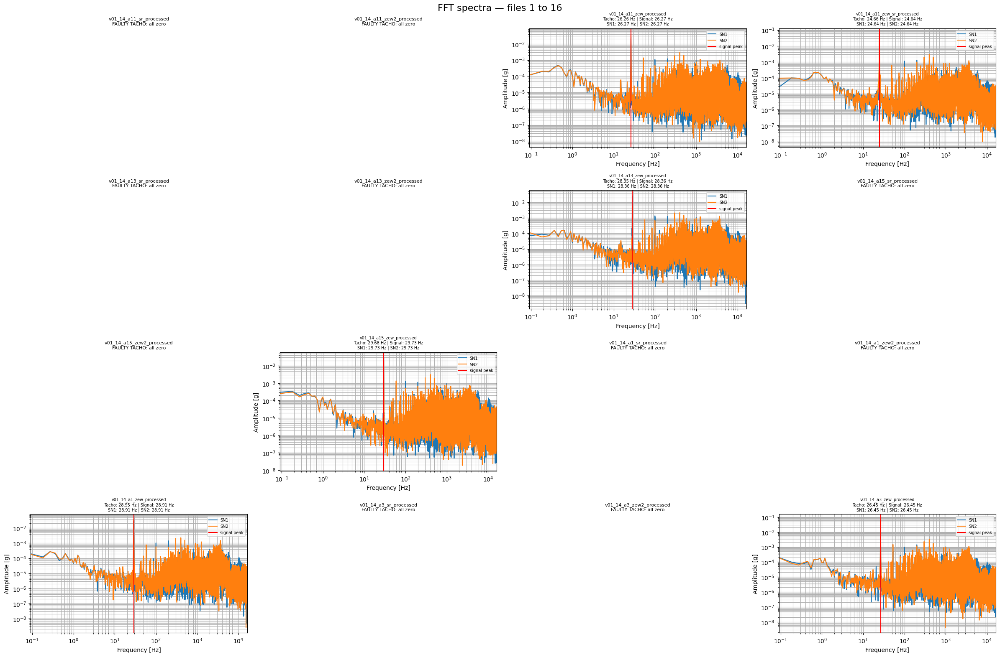

Processing FFT: v01_14_a5_sr_processed.csv
Skipping v01_14_a5_sr_processed.csv: tacho is all zero
Processing FFT: v01_14_a5_zew2_processed.csv
Skipping v01_14_a5_zew2_processed.csv: tacho is all zero
Processing FFT: v01_14_a5_zew_processed.csv
Processing FFT: v01_14_a7_sr_processed.csv
Skipping v01_14_a7_sr_processed.csv: tacho is all zero
Processing FFT: v01_14_a7_zew2_processed.csv
Skipping v01_14_a7_zew2_processed.csv: tacho is all zero
Processing FFT: v01_14_a7_zew_processed.csv
Processing FFT: v01_14_processed.csv
Processing FFT: v02_14_a11_sr_processed.csv
Skipping v02_14_a11_sr_processed.csv: tacho is all zero
Processing FFT: v02_14_a11_zew2_processed.csv
Skipping v02_14_a11_zew2_processed.csv: tacho is all zero
Processing FFT: v02_14_a11_zew_processed.csv
Processing FFT: v02_14_a11_zew_sr_processed.csv
Processing FFT: v02_14_a13_sr_processed.csv
Skipping v02_14_a13_sr_processed.csv: tacho is all zero
Processing FFT: v02_14_a13_zew2_processed.csv
Skipping v02_14_a13_zew2_process

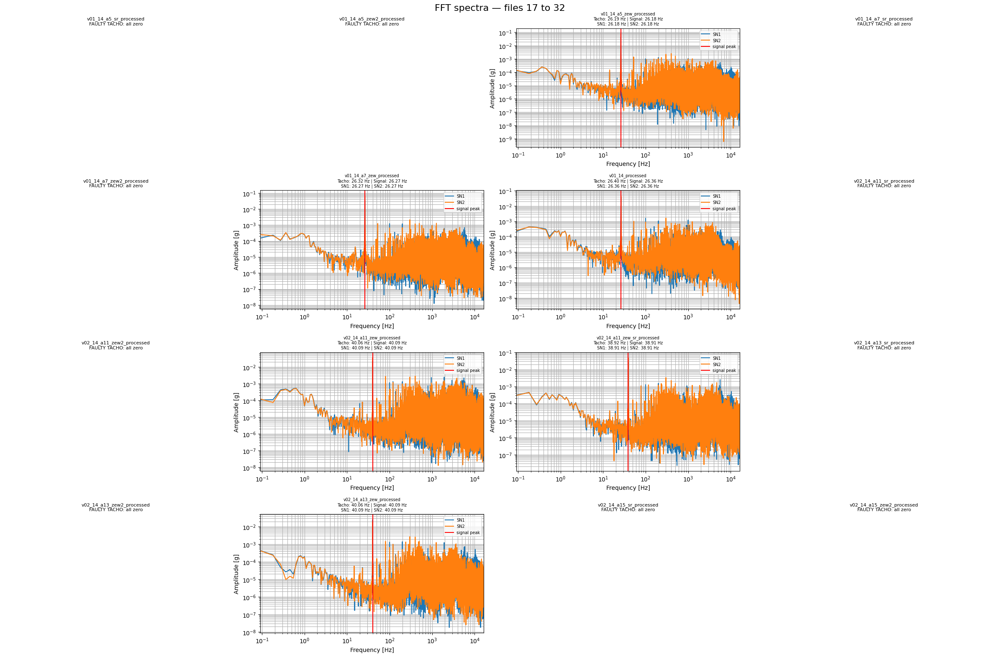

Processing FFT: v02_14_a15_zew_processed.csv
Processing FFT: v02_14_a1_sr_processed.csv
Skipping v02_14_a1_sr_processed.csv: tacho is all zero
Processing FFT: v02_14_a1_zew2_processed.csv
Skipping v02_14_a1_zew2_processed.csv: tacho is all zero
Processing FFT: v02_14_a1_zew_processed.csv
Processing FFT: v02_14_a3_sr_processed.csv
Skipping v02_14_a3_sr_processed.csv: tacho is all zero
Processing FFT: v02_14_a3_zew2_processed.csv
Skipping v02_14_a3_zew2_processed.csv: tacho is all zero
Processing FFT: v02_14_a3_zew_processed.csv
Processing FFT: v02_14_a5_sr_processed.csv
Skipping v02_14_a5_sr_processed.csv: tacho is all zero
Processing FFT: v02_14_a5_zew2_processed.csv
Skipping v02_14_a5_zew2_processed.csv: tacho is all zero
Processing FFT: v02_14_a5_zew_processed.csv
Processing FFT: v02_14_a7_sr_processed.csv
Skipping v02_14_a7_sr_processed.csv: tacho is all zero
Processing FFT: v02_14_a7_zew2_processed.csv
Skipping v02_14_a7_zew2_processed.csv: tacho is all zero
Processing FFT: v02_14_

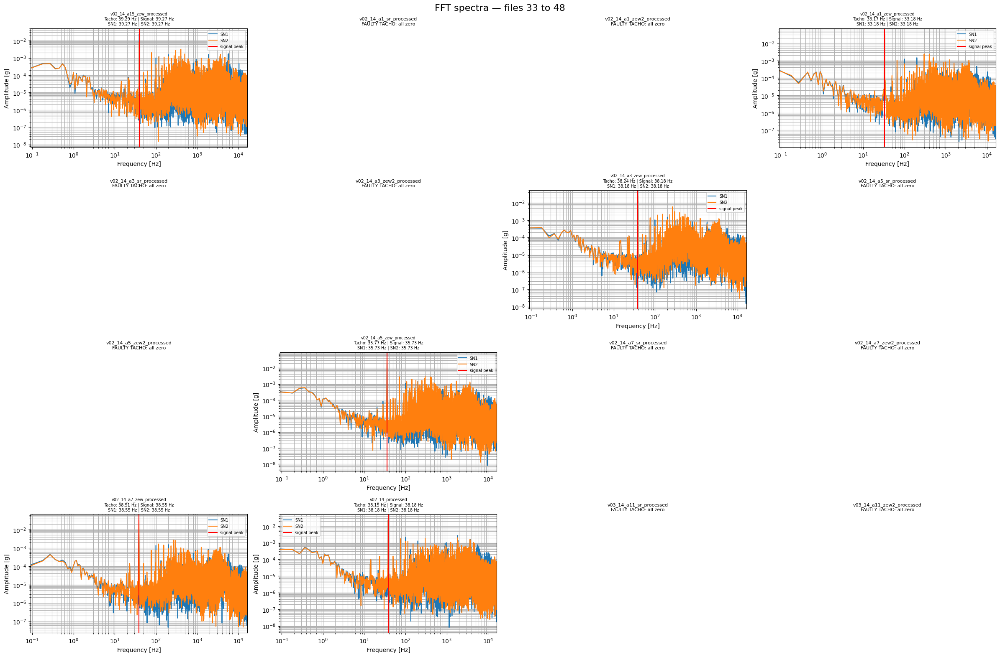

Processing FFT: v03_14_a11_zew_processed.csv
Processing FFT: v03_14_a11_zew_sr_processed.csv
Processing FFT: v03_14_a13_sr_processed.csv
Skipping v03_14_a13_sr_processed.csv: tacho is all zero
Processing FFT: v03_14_a13_zew2_processed.csv
Skipping v03_14_a13_zew2_processed.csv: tacho is all zero
Processing FFT: v03_14_a13_zew_processed.csv
Processing FFT: v03_14_a15_sr_processed.csv
Skipping v03_14_a15_sr_processed.csv: tacho is all zero
Processing FFT: v03_14_a15_zew2_processed.csv
Skipping v03_14_a15_zew2_processed.csv: tacho is all zero
Processing FFT: v03_14_a15_zew_processed.csv
Processing FFT: v03_14_a1_sr_processed.csv
Skipping v03_14_a1_sr_processed.csv: tacho is all zero
Processing FFT: v03_14_a1_zew2_processed.csv
Skipping v03_14_a1_zew2_processed.csv: tacho is all zero
Processing FFT: v03_14_a1_zew_processed.csv
Processing FFT: v03_14_a3_sr_processed.csv
Skipping v03_14_a3_sr_processed.csv: tacho is all zero
Processing FFT: v03_14_a3_zew2_processed.csv
Skipping v03_14_a3_zew

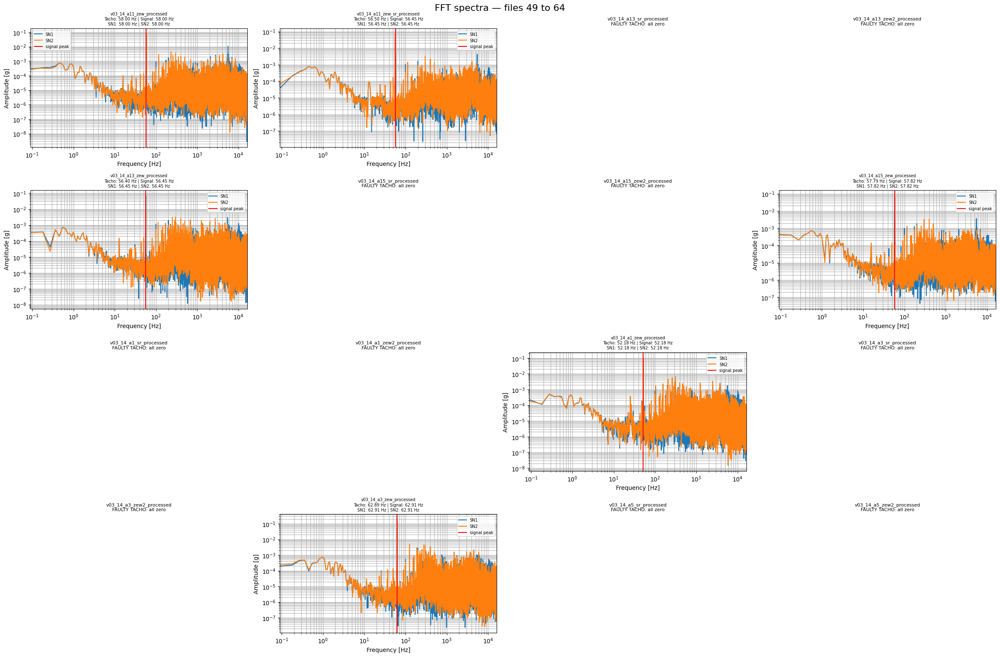

Processing FFT: v03_14_a5_zew_processed.csv
Processing FFT: v03_14_a7_sr_processed.csv
Skipping v03_14_a7_sr_processed.csv: tacho is all zero
Processing FFT: v03_14_a7_zew2_processed.csv
Skipping v03_14_a7_zew2_processed.csv: tacho is all zero
Processing FFT: v03_14_a7_zew_processed.csv
Processing FFT: v03_14_processed.csv
Processing FFT: v04_14_a11_sr_processed.csv
Skipping v04_14_a11_sr_processed.csv: tacho is all zero
Processing FFT: v04_14_a11_zew2_processed.csv
Skipping v04_14_a11_zew2_processed.csv: tacho is all zero
Processing FFT: v04_14_a11_zew_processed.csv
Processing FFT: v04_14_a11_zew_sr_processed.csv
Processing FFT: v04_14_a13_sr_processed.csv
Skipping v04_14_a13_sr_processed.csv: tacho is all zero
Processing FFT: v04_14_a13_zew2_processed.csv
Skipping v04_14_a13_zew2_processed.csv: tacho is all zero
Processing FFT: v04_14_a13_zew_processed.csv
Processing FFT: v04_14_a15_sr_processed.csv
Skipping v04_14_a15_sr_processed.csv: tacho is all zero
Processing FFT: v04_14_a15_ze

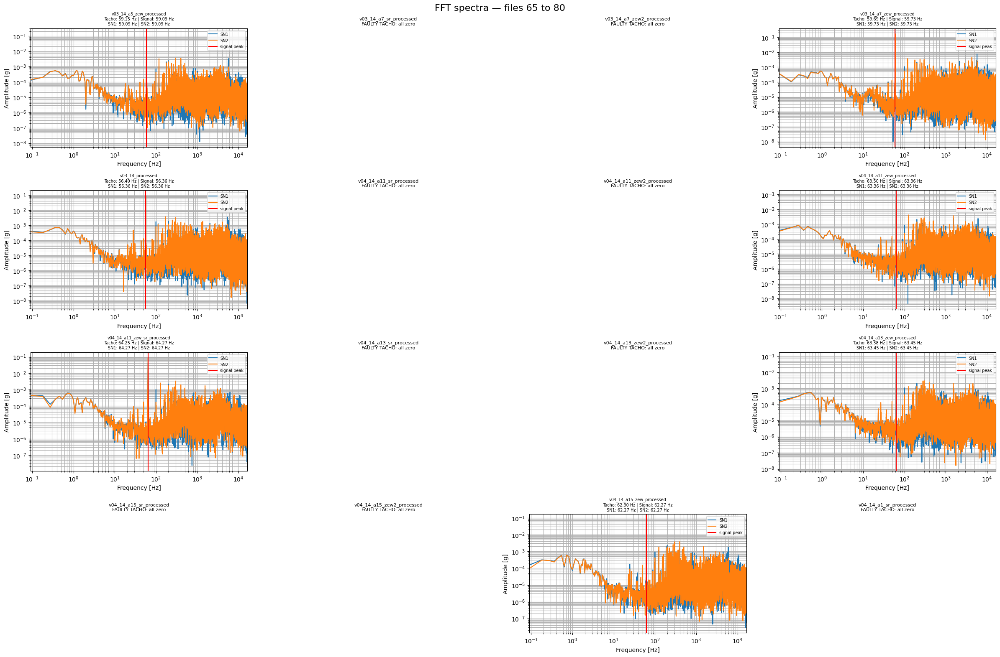

Processing FFT: v04_14_a1_zew2_processed.csv
Skipping v04_14_a1_zew2_processed.csv: tacho is all zero
Processing FFT: v04_14_a1_zew_processed.csv
Processing FFT: v04_14_a3_sr_processed.csv
Skipping v04_14_a3_sr_processed.csv: tacho is all zero
Processing FFT: v04_14_a3_zew2_processed.csv
Skipping v04_14_a3_zew2_processed.csv: tacho is all zero
Processing FFT: v04_14_a3_zew_processed.csv
Processing FFT: v04_14_a5_sr_processed.csv
Skipping v04_14_a5_sr_processed.csv: tacho is all zero
Processing FFT: v04_14_a5_zew2_processed.csv
Skipping v04_14_a5_zew2_processed.csv: tacho is all zero
Processing FFT: v04_14_a5_zew_processed.csv
Processing FFT: v04_14_a7_sr_processed.csv
Skipping v04_14_a7_sr_processed.csv: tacho is all zero
Processing FFT: v04_14_a7_zew2_processed.csv
Skipping v04_14_a7_zew2_processed.csv: tacho is all zero
Processing FFT: v04_14_a7_zew_processed.csv
Processing FFT: v04_14_processed.csv
Processing FFT: v05_14_a11_sr_processed.csv
Skipping v05_14_a11_sr_processed.csv: tac

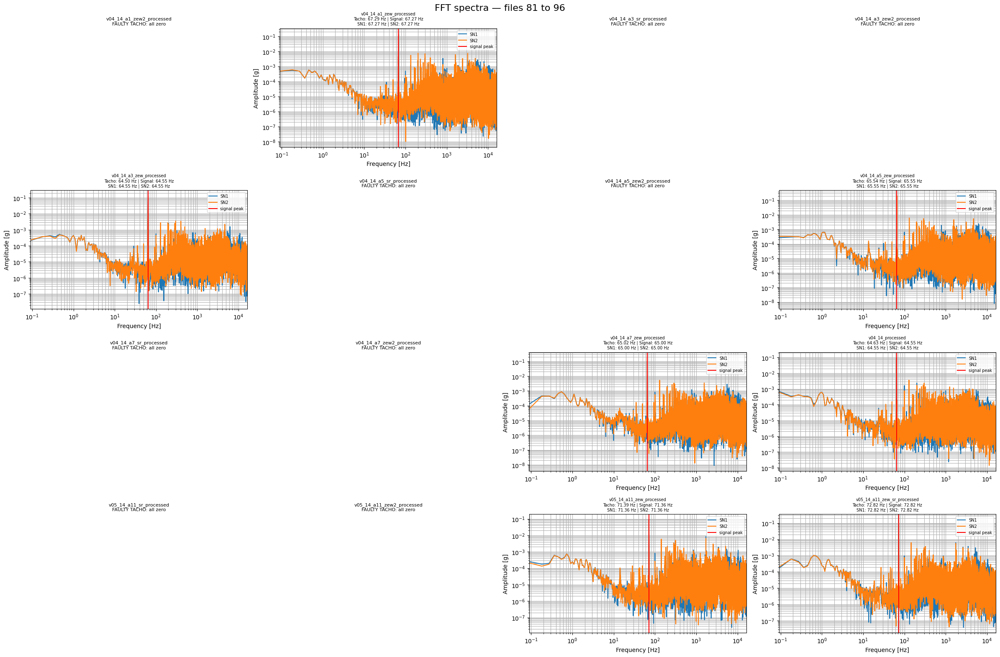

Processing FFT: v05_14_a13_sr_processed.csv
Skipping v05_14_a13_sr_processed.csv: tacho is all zero
Processing FFT: v05_14_a13_zew2_processed.csv
Skipping v05_14_a13_zew2_processed.csv: tacho is all zero
Processing FFT: v05_14_a13_zew_processed.csv
Processing FFT: v05_14_a15_sr_processed.csv
Skipping v05_14_a15_sr_processed.csv: tacho is all zero
Processing FFT: v05_14_a15_zew2_processed.csv
Skipping v05_14_a15_zew2_processed.csv: tacho is all zero
Processing FFT: v05_14_a15_zew_processed.csv
Processing FFT: v05_14_a1_sr_processed.csv
Skipping v05_14_a1_sr_processed.csv: tacho is all zero
Processing FFT: v05_14_a1_zew2_processed.csv
Skipping v05_14_a1_zew2_processed.csv: tacho is all zero
Processing FFT: v05_14_a1_zew_processed.csv
Processing FFT: v05_14_a3_sr_processed.csv
Skipping v05_14_a3_sr_processed.csv: tacho is all zero
Processing FFT: v05_14_a3_zew2_processed.csv
Skipping v05_14_a3_zew2_processed.csv: tacho is all zero
Processing FFT: v05_14_a3_zew_processed.csv
Processing FFT

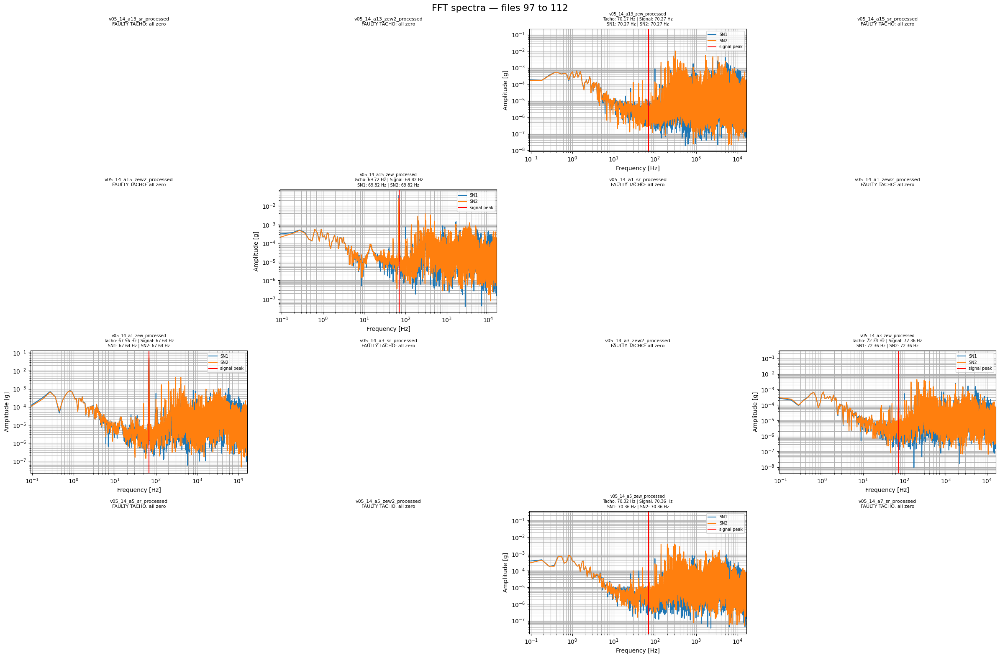

Processing FFT: v05_14_a7_zew2_processed.csv
Skipping v05_14_a7_zew2_processed.csv: tacho is all zero
Processing FFT: v05_14_a7_zew_processed.csv
Processing FFT: v05_14_processed.csv
Processing FFT: v06_14_a11_sr_processed.csv
Skipping v06_14_a11_sr_processed.csv: tacho is all zero
Processing FFT: v06_14_a11_zew2_processed.csv
Skipping v06_14_a11_zew2_processed.csv: tacho is all zero
Processing FFT: v06_14_a11_zew_processed.csv
Processing FFT: v06_14_a11_zew_sr_processed.csv
Processing FFT: v06_14_a13_sr_processed.csv
Skipping v06_14_a13_sr_processed.csv: tacho is all zero
Processing FFT: v06_14_a13_zew2_processed.csv
Skipping v06_14_a13_zew2_processed.csv: tacho is all zero
Processing FFT: v06_14_a13_zew_processed.csv
Processing FFT: v06_14_a15_sr_processed.csv
Skipping v06_14_a15_sr_processed.csv: tacho is all zero
Processing FFT: v06_14_a15_zew2_processed.csv
Skipping v06_14_a15_zew2_processed.csv: tacho is all zero
Processing FFT: v06_14_a15_zew_processed.csv
Processing FFT: v06_14

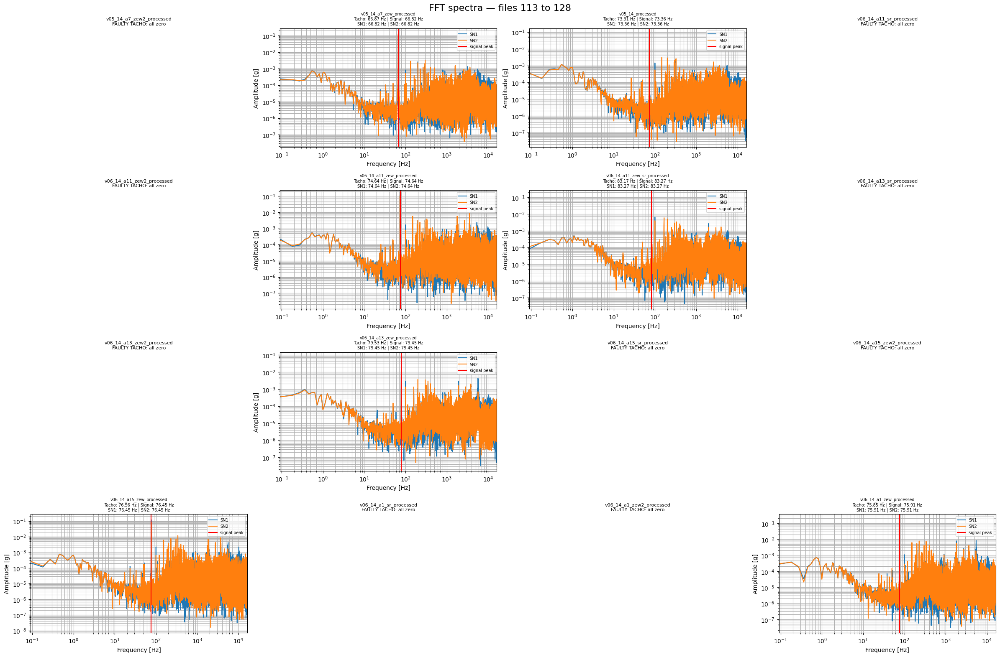

Processing FFT: v06_14_a3_sr_processed.csv
Skipping v06_14_a3_sr_processed.csv: tacho is all zero
Processing FFT: v06_14_a3_zew2_processed.csv
Skipping v06_14_a3_zew2_processed.csv: tacho is all zero
Processing FFT: v06_14_a3_zew_processed.csv
Processing FFT: v06_14_a5_sr_processed.csv
Skipping v06_14_a5_sr_processed.csv: tacho is all zero
Processing FFT: v06_14_a5_zew2_processed.csv
Skipping v06_14_a5_zew2_processed.csv: tacho is all zero
Processing FFT: v06_14_a5_zew_processed.csv
Processing FFT: v06_14_a7_sr_processed.csv
Skipping v06_14_a7_sr_processed.csv: tacho is all zero
Processing FFT: v06_14_a7_zew2_processed.csv
Skipping v06_14_a7_zew2_processed.csv: tacho is all zero
Processing FFT: v06_14_a7_zew_processed.csv
Processing FFT: v06_14_processed.csv
Processing FFT: v07_14_a11_sr_processed.csv
Skipping v07_14_a11_sr_processed.csv: tacho is all zero
Processing FFT: v07_14_a11_zew2_processed.csv
Skipping v07_14_a11_zew2_processed.csv: tacho is all zero
Processing FFT: v07_14_a11_

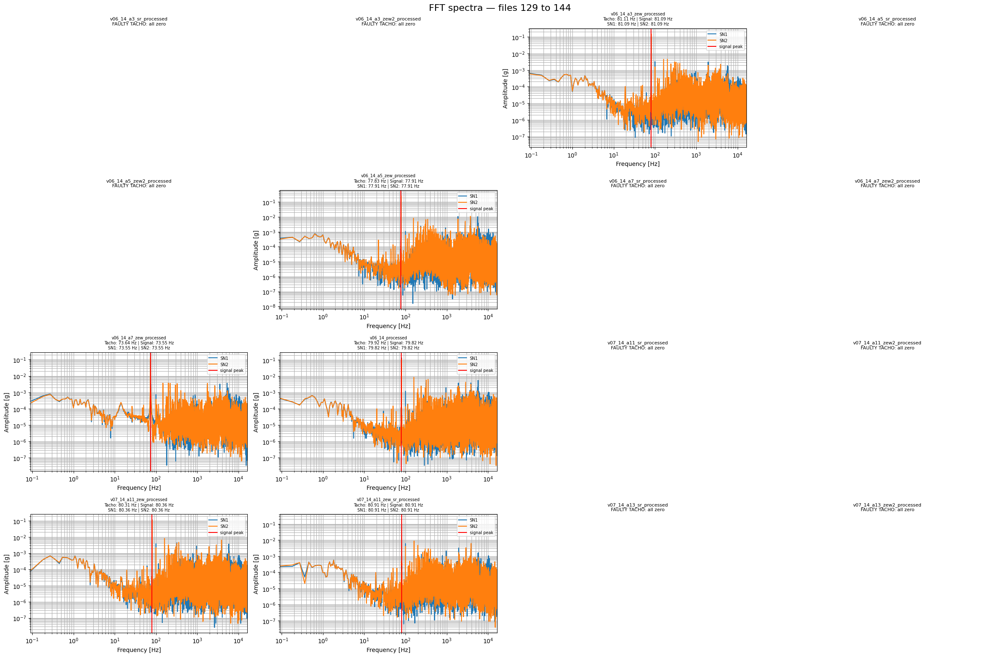

Processing FFT: v07_14_a13_zew_processed.csv
Processing FFT: v07_14_a15_sr_processed.csv
Skipping v07_14_a15_sr_processed.csv: tacho is all zero
Processing FFT: v07_14_a15_zew2_processed.csv
Skipping v07_14_a15_zew2_processed.csv: tacho is all zero
Processing FFT: v07_14_a15_zew_processed.csv
Processing FFT: v07_14_a1_sr_processed.csv
Skipping v07_14_a1_sr_processed.csv: tacho is all zero
Processing FFT: v07_14_a1_zew2_processed.csv
Skipping v07_14_a1_zew2_processed.csv: tacho is all zero
Processing FFT: v07_14_a1_zew_processed.csv
Processing FFT: v07_14_a3_sr_processed.csv
Skipping v07_14_a3_sr_processed.csv: tacho is all zero
Processing FFT: v07_14_a3_zew2_processed.csv
Skipping v07_14_a3_zew2_processed.csv: tacho is all zero
Processing FFT: v07_14_a3_zew_processed.csv
Processing FFT: v07_14_a5_sr_processed.csv
Skipping v07_14_a5_sr_processed.csv: tacho is all zero
Processing FFT: v07_14_a5_zew2_processed.csv
Skipping v07_14_a5_zew2_processed.csv: tacho is all zero
Processing FFT: v0

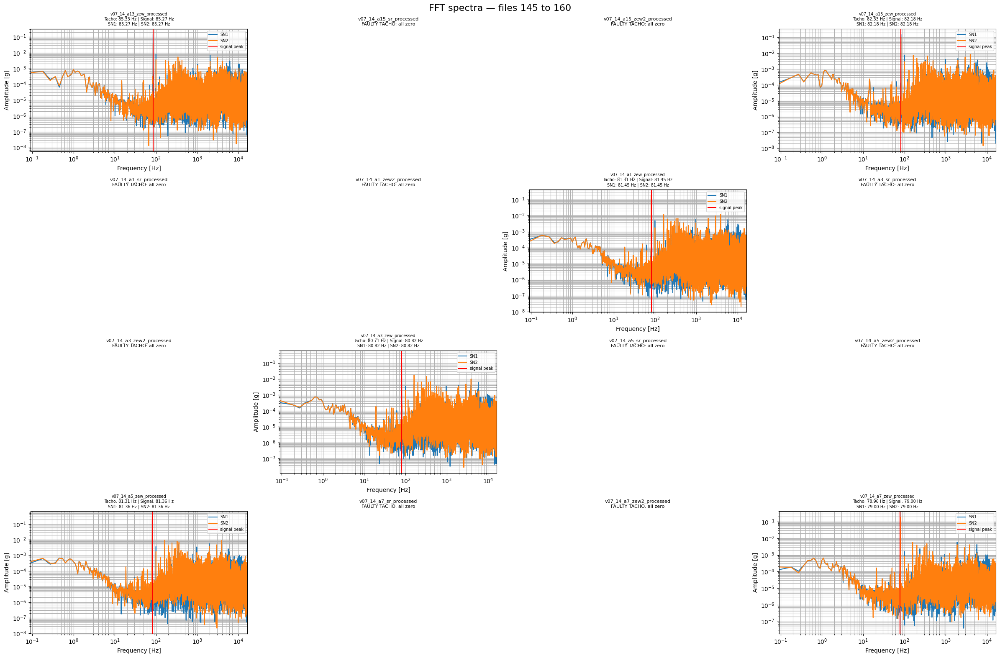

Processing FFT: v07_14_processed.csv
Processing FFT: v08_14_a11_sr_processed.csv
Skipping v08_14_a11_sr_processed.csv: tacho is all zero
Processing FFT: v08_14_a11_zew2_processed.csv
Skipping v08_14_a11_zew2_processed.csv: tacho is all zero
Processing FFT: v08_14_a11_zew_processed.csv
Processing FFT: v08_14_a11_zew_sr_processed.csv
Processing FFT: v08_14_a13_sr_processed.csv
Skipping v08_14_a13_sr_processed.csv: tacho is all zero
Processing FFT: v08_14_a13_zew2_processed.csv
Skipping v08_14_a13_zew2_processed.csv: tacho is all zero
Processing FFT: v08_14_a13_zew_processed.csv
Processing FFT: v08_14_a15_sr_processed.csv
Skipping v08_14_a15_sr_processed.csv: tacho is all zero
Processing FFT: v08_14_a15_zew2_processed.csv
Skipping v08_14_a15_zew2_processed.csv: tacho is all zero
Processing FFT: v08_14_a15_zew_processed.csv
Processing FFT: v08_14_a1_sr_processed.csv
Skipping v08_14_a1_sr_processed.csv: tacho is all zero
Processing FFT: v08_14_a1_zew2_processed.csv
Skipping v08_14_a1_zew2_p

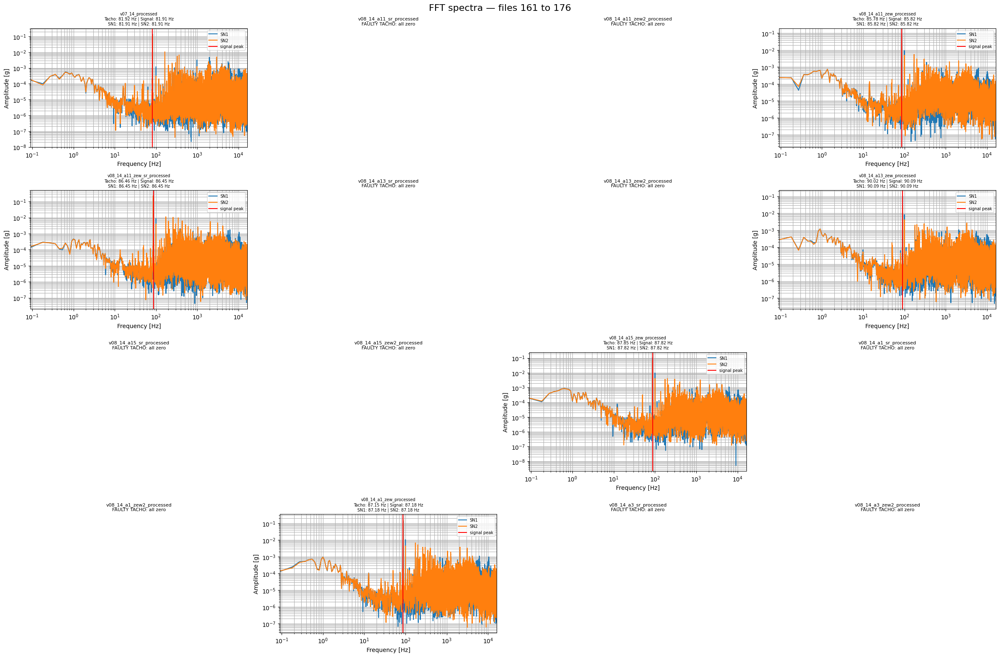

Processing FFT: v08_14_a3_zew_processed.csv
Processing FFT: v08_14_a5_sr_processed.csv
Skipping v08_14_a5_sr_processed.csv: tacho is all zero
Processing FFT: v08_14_a5_zew2_processed.csv
Skipping v08_14_a5_zew2_processed.csv: tacho is all zero
Processing FFT: v08_14_a5_zew_processed.csv
Processing FFT: v08_14_a7_sr_processed.csv
Skipping v08_14_a7_sr_processed.csv: tacho is all zero
Processing FFT: v08_14_a7_zew2_processed.csv
Skipping v08_14_a7_zew2_processed.csv: tacho is all zero
Processing FFT: v08_14_a7_zew_processed.csv
Processing FFT: v08_14_processed.csv
Processing FFT: v09_14_a11_sr_processed.csv
Skipping v09_14_a11_sr_processed.csv: tacho is all zero
Processing FFT: v09_14_a11_zew2_processed.csv
Skipping v09_14_a11_zew2_processed.csv: tacho is all zero
Processing FFT: v09_14_a11_zew_processed.csv
Processing FFT: v09_14_a11_zew_sr_processed.csv
Processing FFT: v09_14_a13_sr_processed.csv
Skipping v09_14_a13_sr_processed.csv: tacho is all zero
Processing FFT: v09_14_a13_zew2_pr

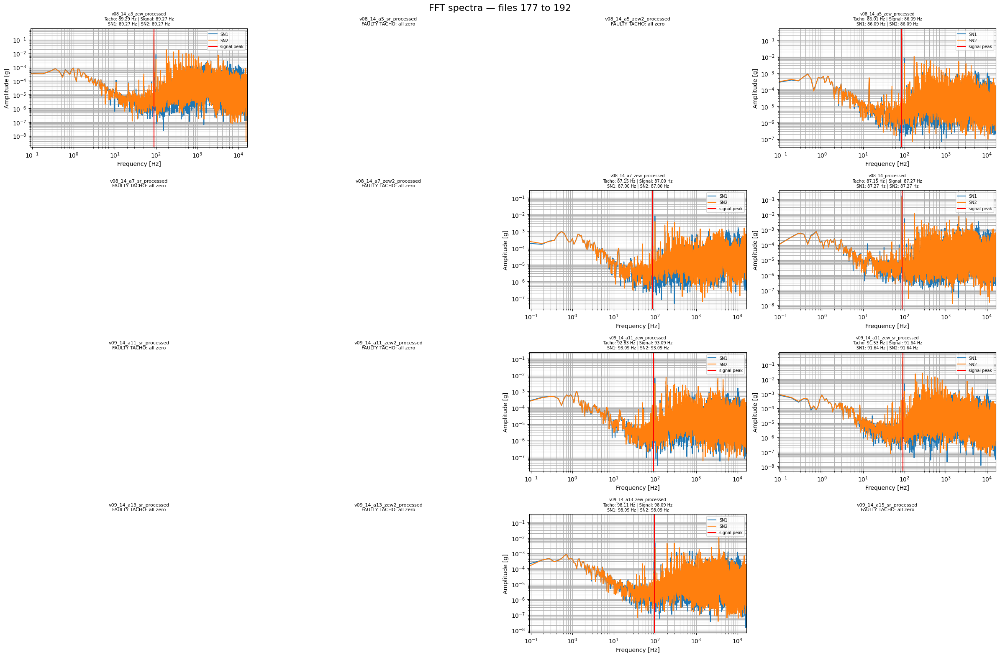

Processing FFT: v09_14_a15_zew2_processed.csv
Skipping v09_14_a15_zew2_processed.csv: tacho is all zero
Processing FFT: v09_14_a15_zew_processed.csv
Processing FFT: v09_14_a1_sr_processed.csv
Skipping v09_14_a1_sr_processed.csv: tacho is all zero
Processing FFT: v09_14_a1_zew2_processed.csv
Skipping v09_14_a1_zew2_processed.csv: tacho is all zero
Processing FFT: v09_14_a1_zew_processed.csv
Processing FFT: v09_14_a3_sr_processed.csv
Skipping v09_14_a3_sr_processed.csv: tacho is all zero
Processing FFT: v09_14_a3_zew2_processed.csv
Skipping v09_14_a3_zew2_processed.csv: tacho is all zero
Processing FFT: v09_14_a3_zew_processed.csv
Processing FFT: v09_14_a5_sr_processed.csv
Skipping v09_14_a5_sr_processed.csv: tacho is all zero
Processing FFT: v09_14_a5_zew2_processed.csv
Skipping v09_14_a5_zew2_processed.csv: tacho is all zero
Processing FFT: v09_14_a5_zew_processed.csv
Processing FFT: v09_14_a7_sr_processed.csv
Skipping v09_14_a7_sr_processed.csv: tacho is all zero
Processing FFT: v09_1

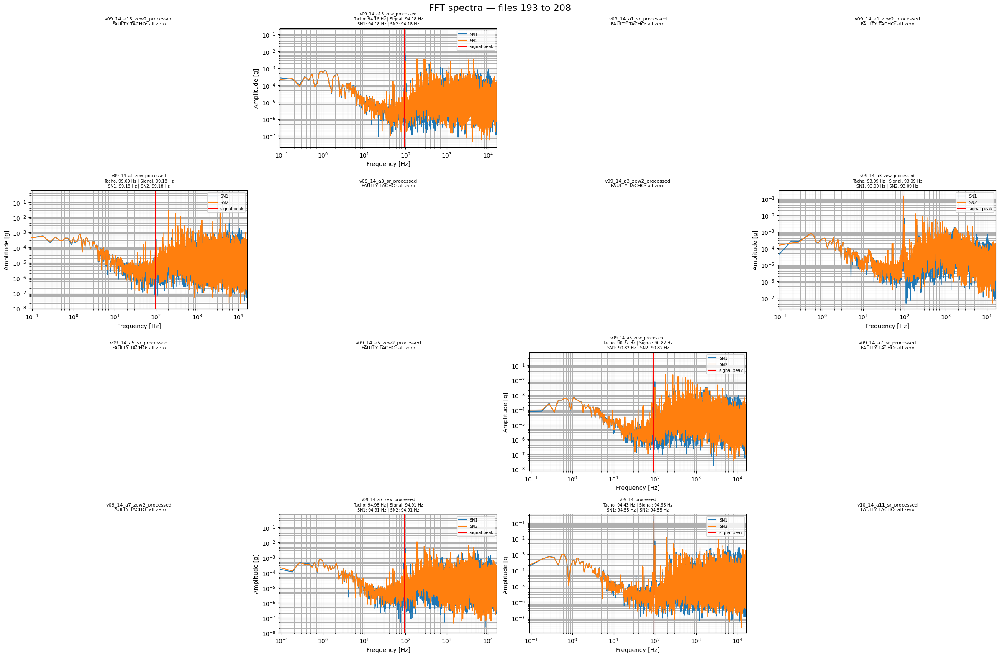

Processing FFT: v10_14_a11_zew2_processed.csv
Skipping v10_14_a11_zew2_processed.csv: tacho is all zero
Processing FFT: v10_14_a11_zew_processed.csv
Processing FFT: v10_14_a11_zew_sr_processed.csv
Processing FFT: v10_14_a13_sr_processed.csv
Skipping v10_14_a13_sr_processed.csv: tacho is all zero
Processing FFT: v10_14_a13_zew2_processed.csv
Skipping v10_14_a13_zew2_processed.csv: tacho is all zero
Processing FFT: v10_14_a13_zew_processed.csv
Processing FFT: v10_14_a15_sr_processed.csv
Skipping v10_14_a15_sr_processed.csv: tacho is all zero
Processing FFT: v10_14_a15_zew2_processed.csv
Skipping v10_14_a15_zew2_processed.csv: tacho is all zero
Processing FFT: v10_14_a15_zew_processed.csv
Processing FFT: v10_14_a1_sr_processed.csv
Skipping v10_14_a1_sr_processed.csv: tacho is all zero
Processing FFT: v10_14_a1_zew2_processed.csv
Skipping v10_14_a1_zew2_processed.csv: tacho is all zero
Processing FFT: v10_14_a1_zew_processed.csv
Processing FFT: v10_14_a3_sr_processed.csv
Skipping v10_14_a3

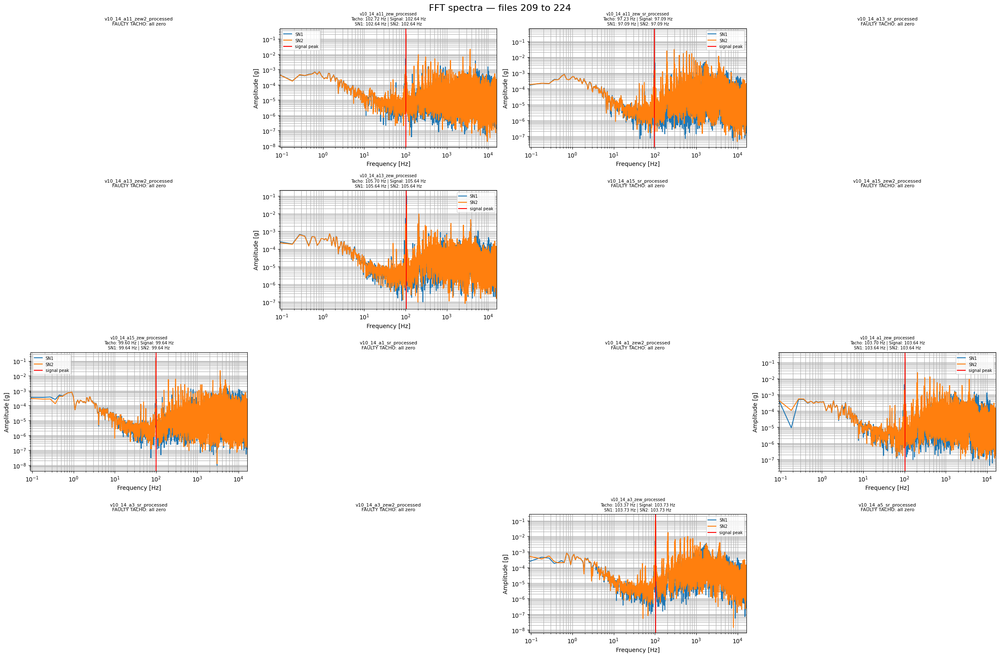

Processing FFT: v10_14_a5_zew2_processed.csv
Skipping v10_14_a5_zew2_processed.csv: tacho is all zero
Processing FFT: v10_14_a5_zew_processed.csv
Processing FFT: v10_14_a7_sr_processed.csv
Skipping v10_14_a7_sr_processed.csv: tacho is all zero
Processing FFT: v10_14_a7_zew2_processed.csv
Skipping v10_14_a7_zew2_processed.csv: tacho is all zero
Processing FFT: v10_14_a7_zew_processed.csv
Processing FFT: v10_14_processed.csv
Processing FFT: v11_14_a11_sr_processed.csv
Skipping v11_14_a11_sr_processed.csv: tacho is all zero
Processing FFT: v11_14_a11_zew2_processed.csv
Skipping v11_14_a11_zew2_processed.csv: tacho is all zero
Processing FFT: v11_14_a11_zew_processed.csv
Processing FFT: v11_14_a11_zew_sr_processed.csv
Processing FFT: v11_14_a13_sr_processed.csv
Skipping v11_14_a13_sr_processed.csv: tacho is all zero
Processing FFT: v11_14_a13_zew2_processed.csv
Skipping v11_14_a13_zew2_processed.csv: tacho is all zero
Processing FFT: v11_14_a13_zew_processed.csv
Processing FFT: v11_14_a15_

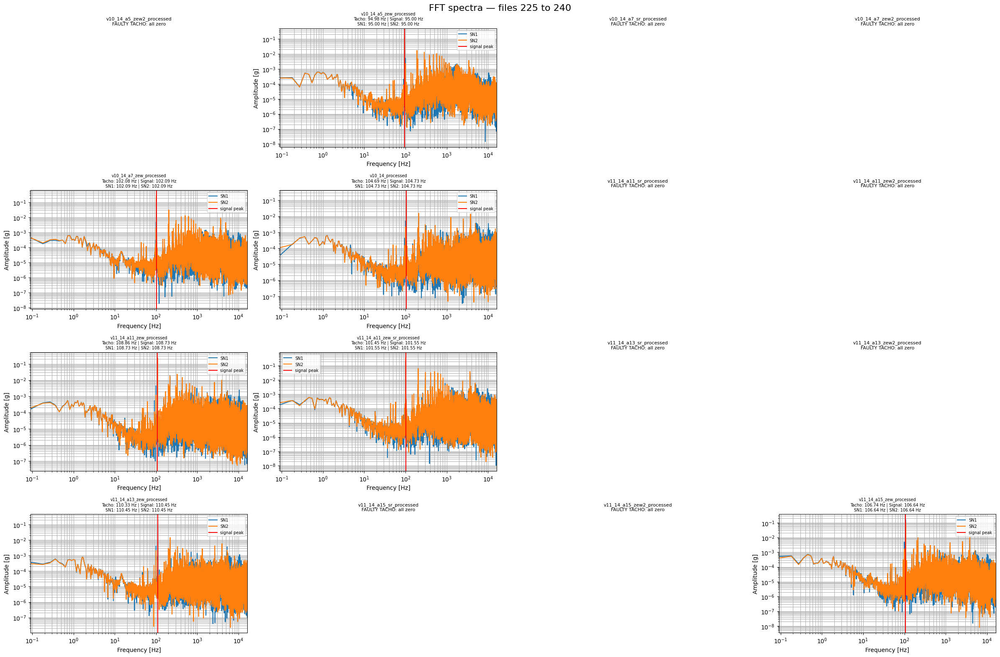

Processing FFT: v11_14_a1_sr_processed.csv
Skipping v11_14_a1_sr_processed.csv: tacho is all zero
Processing FFT: v11_14_a1_zew2_processed.csv
Skipping v11_14_a1_zew2_processed.csv: tacho is all zero
Processing FFT: v11_14_a1_zew_processed.csv
Processing FFT: v11_14_a3_sr_processed.csv
Skipping v11_14_a3_sr_processed.csv: tacho is all zero
Processing FFT: v11_14_a3_zew2_processed.csv
Skipping v11_14_a3_zew2_processed.csv: tacho is all zero
Processing FFT: v11_14_a3_zew_processed.csv
Processing FFT: v11_14_a5_sr_processed.csv
Skipping v11_14_a5_sr_processed.csv: tacho is all zero
Processing FFT: v11_14_a5_zew2_processed.csv
Skipping v11_14_a5_zew2_processed.csv: tacho is all zero
Processing FFT: v11_14_a5_zew_processed.csv
Processing FFT: v11_14_a7_sr_processed.csv
Skipping v11_14_a7_sr_processed.csv: tacho is all zero
Processing FFT: v11_14_a7_zew2_processed.csv
Skipping v11_14_a7_zew2_processed.csv: tacho is all zero
Processing FFT: v11_14_a7_zew_processed.csv
Processing FFT: v11_14_p

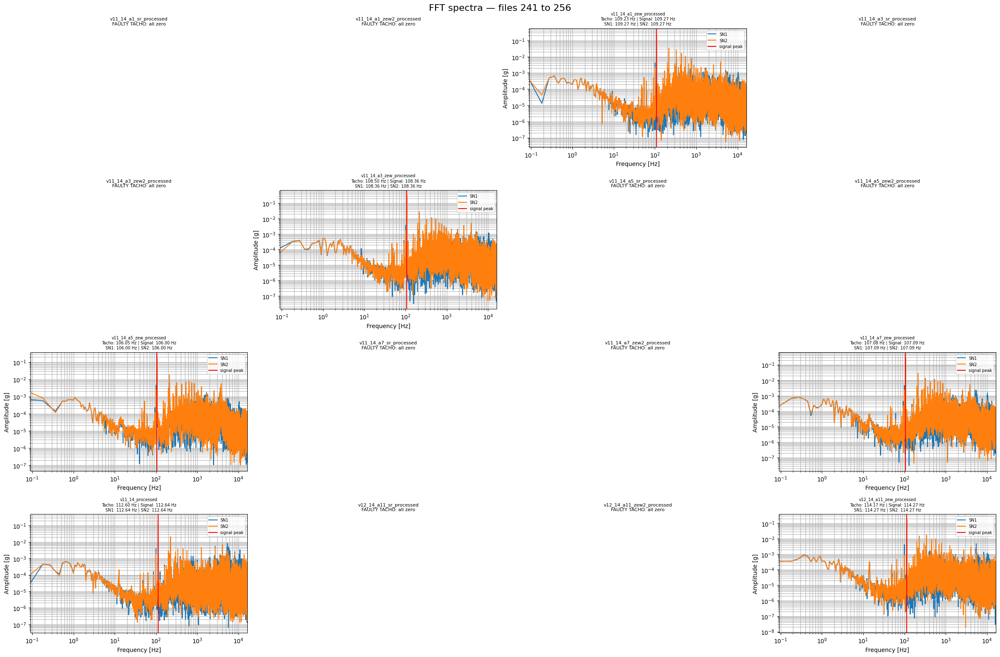

Processing FFT: v12_14_a11_zew_sr_processed.csv
Processing FFT: v12_14_a13_sr_processed.csv
Skipping v12_14_a13_sr_processed.csv: tacho is all zero
Processing FFT: v12_14_a13_zew2_processed.csv
Skipping v12_14_a13_zew2_processed.csv: tacho is all zero
Processing FFT: v12_14_a13_zew_processed.csv
Processing FFT: v12_14_a15_sr_processed.csv
Skipping v12_14_a15_sr_processed.csv: tacho is all zero
Processing FFT: v12_14_a15_zew2_processed.csv
Skipping v12_14_a15_zew2_processed.csv: tacho is all zero
Processing FFT: v12_14_a15_zew_processed.csv
Processing FFT: v12_14_a1_sr_processed.csv
Skipping v12_14_a1_sr_processed.csv: tacho is all zero
Processing FFT: v12_14_a1_zew2_processed.csv
Skipping v12_14_a1_zew2_processed.csv: tacho is all zero
Processing FFT: v12_14_a1_zew_processed.csv
Processing FFT: v12_14_a3_sr_processed.csv
Skipping v12_14_a3_sr_processed.csv: tacho is all zero
Processing FFT: v12_14_a3_zew2_processed.csv
Skipping v12_14_a3_zew2_processed.csv: tacho is all zero
Processing

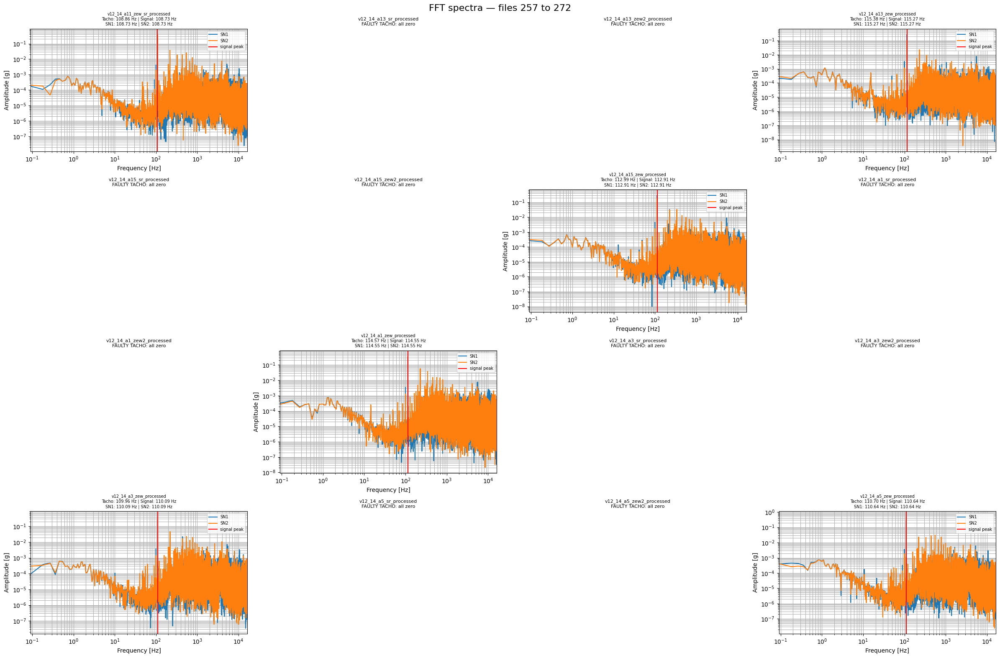

Processing FFT: v12_14_a7_sr_processed.csv
Skipping v12_14_a7_sr_processed.csv: tacho is all zero
Processing FFT: v12_14_a7_zew2_processed.csv
Skipping v12_14_a7_zew2_processed.csv: tacho is all zero
Processing FFT: v12_14_a7_zew_processed.csv
Processing FFT: v12_14_processed.csv
Processing FFT: v13_14_a11_sr_processed.csv
Skipping v13_14_a11_sr_processed.csv: tacho is all zero
Processing FFT: v13_14_a11_zew2_processed.csv
Skipping v13_14_a11_zew2_processed.csv: tacho is all zero
Processing FFT: v13_14_a11_zew_processed.csv
Processing FFT: v13_14_a11_zew_sr_processed.csv
Processing FFT: v13_14_a13_sr_processed.csv
Skipping v13_14_a13_sr_processed.csv: tacho is all zero
Processing FFT: v13_14_a13_zew2_processed.csv
Skipping v13_14_a13_zew2_processed.csv: tacho is all zero
Processing FFT: v13_14_a13_zew_processed.csv
Processing FFT: v13_14_a15_sr_processed.csv
Skipping v13_14_a15_sr_processed.csv: tacho is all zero
Processing FFT: v13_14_a15_zew2_processed.csv
Skipping v13_14_a15_zew2_pr

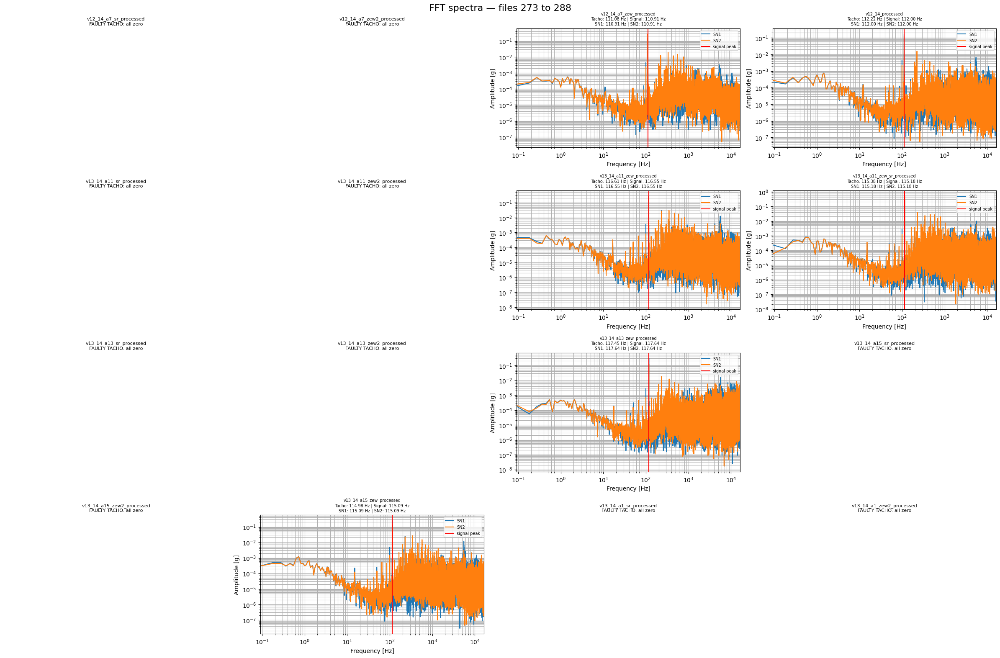

Processing FFT: v13_14_a1_zew_processed.csv
Processing FFT: v13_14_a3_sr_processed.csv
Skipping v13_14_a3_sr_processed.csv: tacho is all zero
Processing FFT: v13_14_a3_zew2_processed.csv
Skipping v13_14_a3_zew2_processed.csv: tacho is all zero
Processing FFT: v13_14_a3_zew_processed.csv
Processing FFT: v13_14_a5_sr_processed.csv
Skipping v13_14_a5_sr_processed.csv: tacho is all zero
Processing FFT: v13_14_a5_zew2_processed.csv
Skipping v13_14_a5_zew2_processed.csv: tacho is all zero
Processing FFT: v13_14_a5_zew_processed.csv
Processing FFT: v13_14_a7_sr_processed.csv
Skipping v13_14_a7_sr_processed.csv: tacho is all zero
Processing FFT: v13_14_a7_zew2_processed.csv
Skipping v13_14_a7_zew2_processed.csv: tacho is all zero
Processing FFT: v13_14_a7_zew_processed.csv
Processing FFT: v13_14_processed.csv
Processing FFT: v14_14_a11_sr_processed.csv
Skipping v14_14_a11_sr_processed.csv: tacho is all zero
Processing FFT: v14_14_a11_zew2_processed.csv
Skipping v14_14_a11_zew2_processed.csv: t

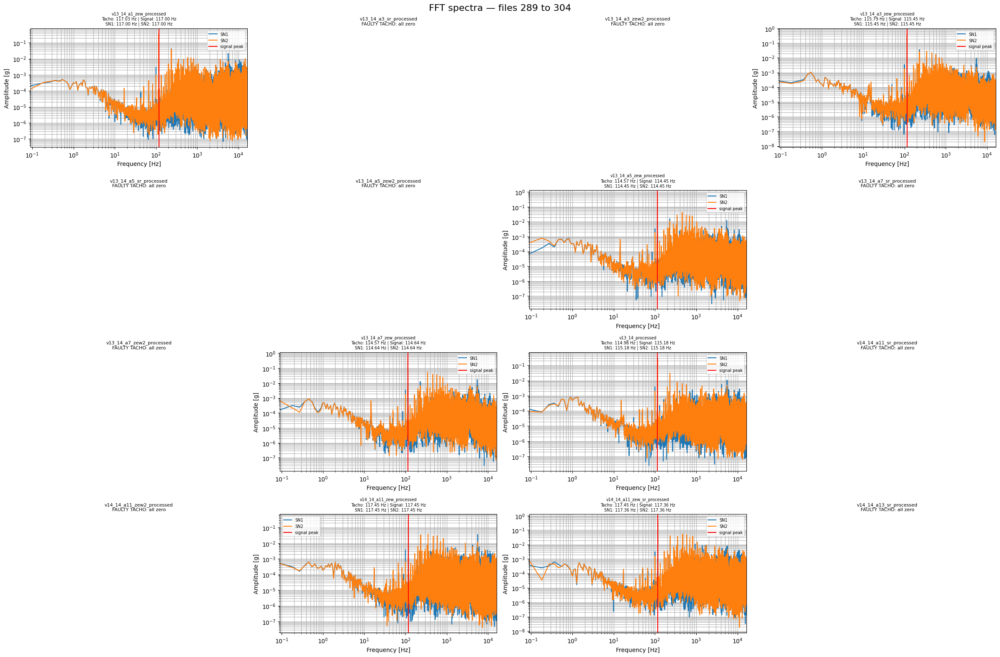

Processing FFT: v14_14_a13_zew2_processed.csv
Skipping v14_14_a13_zew2_processed.csv: tacho is all zero
Processing FFT: v14_14_a13_zew_processed.csv
Processing FFT: v14_14_a15_sr_processed.csv
Skipping v14_14_a15_sr_processed.csv: tacho is all zero
Processing FFT: v14_14_a15_zew2_processed.csv
Skipping v14_14_a15_zew2_processed.csv: tacho is all zero
Processing FFT: v14_14_a15_zew_processed.csv
Processing FFT: v14_14_a1_sr_processed.csv
Skipping v14_14_a1_sr_processed.csv: tacho is all zero
Processing FFT: v14_14_a1_zew2_processed.csv
Skipping v14_14_a1_zew2_processed.csv: tacho is all zero
Processing FFT: v14_14_a1_zew_processed.csv
Processing FFT: v14_14_a3_sr_processed.csv
Skipping v14_14_a3_sr_processed.csv: tacho is all zero
Processing FFT: v14_14_a3_zew2_processed.csv
Skipping v14_14_a3_zew2_processed.csv: tacho is all zero
Processing FFT: v14_14_a3_zew_processed.csv
Processing FFT: v14_14_a5_sr_processed.csv
Skipping v14_14_a5_sr_processed.csv: tacho is all zero
Processing FFT: 

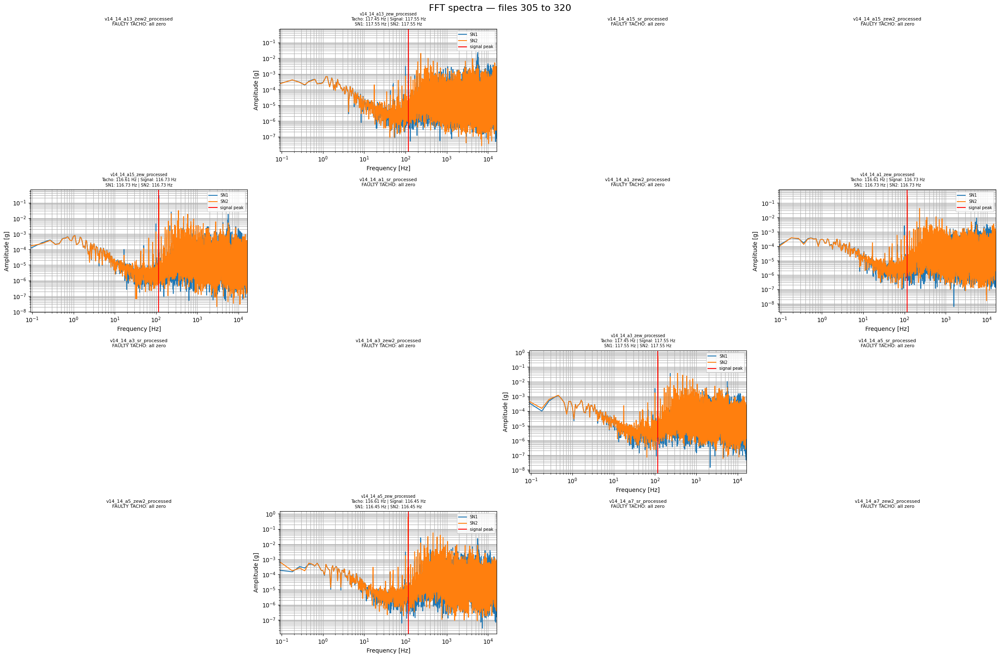

Processing FFT: v14_14_a7_zew_processed.csv
Processing FFT: v14_14_processed.csv


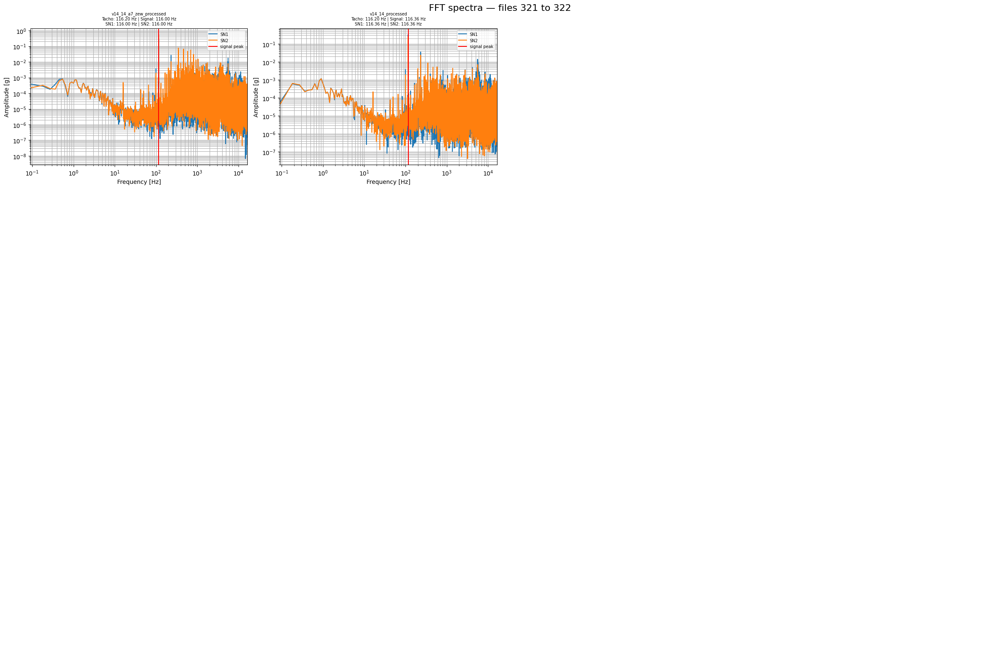

,filename,status,sampling_frequency_Hz,rotation_frequency_tacho_Hz,signal_peak_mean_Hz,SN1_peak_Hz,SN2_peak_Hz
0,v01_14_a11_sr_processed.csv,faulty tacho: all zero,NaN,NaN,NaN,NaN,NaN
1,v01_14_a11_zew2_processed.csv,faulty tacho: all zero,NaN,NaN,NaN,NaN,NaN
2,v01_14_a11_zew_processed.csv,ok,32768.0,26.256410,26.272800,26.272800,26.272800
3,v01_14_a11_zew_sr_processed.csv,ok,32768.0,24.656132,24.636432,24.636432,24.636432
4,v01_14_a13_sr_processed.csv,faulty tacho: all zero,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
317,v14_14_a5_zew_processed.csv,ok,32768.0,116.612100,116.454869,116.454869,116.454869
318,v14_14_a7_sr_processed.csv,faulty tacho: all zero,NaN,NaN,NaN,NaN,NaN
319,v14_14_a7_zew2_processed.csv,faulty tacho: all zero,NaN,NaN,NaN,NaN,NaN
320,v14_14_a7_zew_processed.csv,ok,32768.0,116.198582,116.000322,116.000322,116.000322


In [4]:
fft_summary_rows = []

for fig_idx in range(0, len(files), plots_per_fig):
    batch = files[fig_idx:fig_idx + plots_per_fig]

    fig, axes = plt.subplots(4, 4, figsize=(24, 16))
    axes = axes.flatten()

    for ax, file in zip(axes, batch):
        print(f"Processing FFT: {file.name}")

        data = pd.read_csv(file)

        required_cols = [time_col, tacho_col] + sensor_cols
        missing_cols = [col for col in required_cols if col not in data.columns]

        if missing_cols:
            ax.set_title(f"{file.stem}\nMissing: {missing_cols}", fontsize=7)
            ax.axis("off")

            fft_summary_rows.append({
                "filename": file.name,
                "status": f"missing columns: {missing_cols}",
                "sampling_frequency_Hz": np.nan,
                "rotation_frequency_tacho_Hz": np.nan,
                "signal_peak_mean_Hz": np.nan,
                "SN1_peak_Hz": np.nan,
                "SN2_peak_Hz": np.nan,
            })
            continue

        if is_tacho_full_zero(data[tacho_col]):
            ax.set_title(f"{file.stem}\nFAULTY TACHO: all zero", fontsize=8)
            ax.axis("off")
            print(f"Skipping {file.name}: tacho is all zero")

            fft_summary_rows.append({
                "filename": file.name,
                "status": "faulty tacho: all zero",
                "sampling_frequency_Hz": np.nan,
                "rotation_frequency_tacho_Hz": np.nan,
                "signal_peak_mean_Hz": np.nan,
                "SN1_peak_Hz": np.nan,
                "SN2_peak_Hz": np.nan,
            })
            continue

        fs, dt = get_sampling_frequency(data[time_col])
        f_tacho, pulse_times = get_rotation_frequency_from_tacho(data[time_col], data[tacho_col])

        if not np.isfinite(f_tacho):
            ax.set_title(f"{file.stem}\nFAULTY TACHO: pulses not detected", fontsize=8)
            ax.axis("off")
            print(f"Skipping {file.name}: could not detect tacho pulses")

            fft_summary_rows.append({
                "filename": file.name,
                "status": "faulty tacho: pulses not detected",
                "sampling_frequency_Hz": fs,
                "rotation_frequency_tacho_Hz": np.nan,
                "signal_peak_mean_Hz": np.nan,
                "SN1_peak_Hz": np.nan,
                "SN2_peak_Hz": np.nan,
            })
            continue

        spectra = {}
        signal_peak_freqs = []
        first_positive_freq = np.nan

        for col in sensor_cols:
            freqs, amp, fft_complex = calculate_fft(data[col], fs)

            if len(freqs) == 0:
                continue

            amp = np.maximum(amp, 1e-12)

            positive_freqs = freqs[freqs > 0]
            if len(positive_freqs) > 0:
                current_first_positive = positive_freqs[0]

                if not np.isfinite(first_positive_freq):
                    first_positive_freq = current_first_positive
                else:
                    first_positive_freq = min(first_positive_freq, current_first_positive)

            f_signal, amp_signal, peak_idx = find_peak_near_frequency(freqs, amp, f_tacho)

            spectra[col] = {
                "freqs": freqs,
                "amp": amp,
                "f_signal": f_signal,
                "amp_signal": amp_signal,
                "peak_idx": peak_idx,
            }

            if np.isfinite(f_signal):
                signal_peak_freqs.append(f_signal)

            if use_log_x:
                plot_mask = freqs > 0
            else:
                plot_mask = np.ones_like(freqs, dtype=bool)

            ax.plot(freqs[plot_mask], amp[plot_mask], label=sensor_short_name(col))

        if len(signal_peak_freqs) > 0:
            f_signal_mean = np.mean(signal_peak_freqs)

            if np.isfinite(f_signal_mean) and f_signal_mean > 0:
                ax.axvline(
                    f_signal_mean,
                    color="red",
                    linestyle="-",
                    linewidth=1.5,
                    label="signal peak"
                )
        else:
            f_signal_mean = np.nan

        sn1_freq = spectra.get("ACXXX_SN1 [g]", {}).get("f_signal", np.nan)
        sn2_freq = spectra.get("ACXXX_SN2 [g]", {}).get("f_signal", np.nan)

        fft_summary_rows.append({
            "filename": file.name,
            "status": "ok",
            "sampling_frequency_Hz": fs,
            "rotation_frequency_tacho_Hz": f_tacho,
            "signal_peak_mean_Hz": f_signal_mean,
            "SN1_peak_Hz": sn1_freq,
            "SN2_peak_Hz": sn2_freq,
        })

        ax.set_title(
            f"{file.stem}\n"
            f"Tacho: {f_tacho:.2f} Hz | Signal: {f_signal_mean:.2f} Hz\n"
            f"SN1: {sn1_freq:.2f} Hz | SN2: {sn2_freq:.2f} Hz",
            fontsize=7
        )

        ax.set_xlabel("Frequency [Hz]")
        ax.set_ylabel("Amplitude [g]")

        if use_log_x:
            ax.set_xscale("log")

        if use_log_y:
            ax.set_yscale("log")

        ax.grid(True, which="both")
        ax.legend(fontsize=7)

        if fft_xlim_hz == "full":
            if use_log_x:
                ax.set_xlim(first_positive_freq, fs / 2)
            else:
                ax.set_xlim(0, fs / 2)

        elif fft_xlim_hz is not None:
            if use_log_x:
                ax.set_xlim(first_positive_freq, fft_xlim_hz)
            else:
                ax.set_xlim(0, fft_xlim_hz)

        else:
            x_max = max(5 * f_tacho, f_tacho + 20)

            if use_log_x:
                ax.set_xlim(first_positive_freq, x_max)
            else:
                ax.set_xlim(0, x_max)

    for ax in axes[len(batch):]:
        ax.axis("off")

    fig.suptitle(
        f"FFT spectra — files {fig_idx + 1} to {fig_idx + len(batch)}",
        fontsize=16
    )

    plt.tight_layout()
    plt.show()

fft_summary_df = pd.DataFrame(fft_summary_rows)
display(fft_summary_df)

fft_summary_df.to_csv("fft_tacho_signal_summary.csv", index=False)

## 2. Imbalance 

In [5]:
imbalance_results = []

for file in files:
    print(f"Calculating imbalance vector using tacho FFT phase: {file.name}")

    data = pd.read_csv(file)

    required_cols = [time_col, tacho_col] + sensor_cols
    missing_cols = [col for col in required_cols if col not in data.columns]

    if missing_cols:
        imbalance_results.append({
            "filename": file.name,
            "sensor": None,
            "status": f"missing columns: {missing_cols}",
            "rotation_frequency_Hz": np.nan,
            "value_g": np.nan,
            "angle_deg": np.nan,
            "sensor_phase_deg": np.nan,
            "tacho_phase_deg": np.nan,
            "tacho_fft_value": np.nan,
        })
        continue

    if is_tacho_full_zero(data[tacho_col]):
        imbalance_results.append({
            "filename": file.name,
            "sensor": None,
            "status": "faulty tacho: all zero",
            "rotation_frequency_Hz": np.nan,
            "value_g": np.nan,
            "angle_deg": np.nan,
            "sensor_phase_deg": np.nan,
            "tacho_phase_deg": np.nan,
            "tacho_fft_value": np.nan,
        })
        continue

    f_tacho, pulse_times = get_rotation_frequency_from_tacho(data[time_col], data[tacho_col])

    if not np.isfinite(f_tacho) or len(pulse_times) < 2:
        imbalance_results.append({
            "filename": file.name,
            "sensor": None,
            "status": "faulty tacho: pulses not detected",
            "rotation_frequency_Hz": np.nan,
            "value_g": np.nan,
            "angle_deg": np.nan,
            "sensor_phase_deg": np.nan,
            "tacho_phase_deg": np.nan,
            "tacho_fft_value": np.nan,
        })
        continue

    for col in sensor_cols:
        result = calculate_sensor_phase_relative_to_tacho(
            data[time_col],
            data[col],
            data[tacho_col],
            f_tacho
        )

        imbalance_results.append({
            "filename": file.name,
            "sensor": sensor_short_name(col),
            "status": "ok",
            "rotation_frequency_Hz": f_tacho,
            "value_g": result["value_g"],
            "angle_deg": result["angle_deg"],
            "sensor_phase_deg": result["sensor_phase_deg"],
            "tacho_phase_deg": result["tacho_phase_deg"],
            "tacho_fft_value": result["tacho_fft_value"],
        })

imbalance_df = pd.DataFrame(imbalance_results)

display(imbalance_df)

imbalance_df.to_csv("imbalance_vectors_tacho_fft_phase.csv", index=False)

Calculating imbalance vector using tacho FFT phase: v01_14_a11_sr_processed.csv
Calculating imbalance vector using tacho FFT phase: v01_14_a11_zew2_processed.csv
Calculating imbalance vector using tacho FFT phase: v01_14_a11_zew_processed.csv
Calculating imbalance vector using tacho FFT phase: v01_14_a11_zew_sr_processed.csv
Calculating imbalance vector using tacho FFT phase: v01_14_a13_sr_processed.csv
Calculating imbalance vector using tacho FFT phase: v01_14_a13_zew2_processed.csv
Calculating imbalance vector using tacho FFT phase: v01_14_a13_zew_processed.csv
Calculating imbalance vector using tacho FFT phase: v01_14_a15_sr_processed.csv
Calculating imbalance vector using tacho FFT phase: v01_14_a15_zew2_processed.csv
Calculating imbalance vector using tacho FFT phase: v01_14_a15_zew_processed.csv
Calculating imbalance vector using tacho FFT phase: v01_14_a1_sr_processed.csv
Calculating imbalance vector using tacho FFT phase: v01_14_a1_zew2_processed.csv
Calculating imbalance vecto

,filename,sensor,status,rotation_frequency_Hz,value_g,angle_deg,sensor_phase_deg,tacho_phase_deg,tacho_fft_value
0,v01_14_a11_sr_processed.csv,NaN,faulty tacho: all zero,NaN,NaN,NaN,NaN,NaN,NaN
1,v01_14_a11_zew2_processed.csv,NaN,faulty tacho: all zero,NaN,NaN,NaN,NaN,NaN,NaN
2,v01_14_a11_zew_processed.csv,SN1,ok,26.256410,0.026837,8.392719,27.022668,18.629950,0.003939
3,v01_14_a11_zew_processed.csv,SN2,ok,26.256410,0.043413,-99.794229,-81.164279,18.629950,0.003939
4,v01_14_a11_zew_sr_processed.csv,SN1,ok,24.656132,0.018156,46.431271,8.385533,-38.045738,0.003371
...,...,...,...,...,...,...,...,...,...
443,v14_14_a7_zew2_processed.csv,NaN,faulty tacho: all zero,NaN,NaN,NaN,NaN,NaN,NaN
444,v14_14_a7_zew_processed.csv,SN1,ok,116.198582,0.028177,-26.745626,39.639294,66.384920,0.001405
445,v14_14_a7_zew_processed.csv,SN2,ok,116.198582,0.050213,-169.385158,-103.000238,66.384920,0.001405
446,v14_14_processed.csv,SN1,ok,116.198582,0.057567,-29.576647,-67.128431,-37.551785,0.002974


## 3. Prepare position dataframe

In [6]:
plot_df = imbalance_df.copy()
plot_df = plot_df[plot_df["status"] == "ok"].copy()

plot_df = add_position_columns(plot_df)

plot_df = plot_df.dropna(
    subset=["position_label", "position_number", "angle_deg", "value_g"]
).copy()

plot_df = plot_df.sort_values(["position_number", "sensor", "filename"]).reset_index(drop=True)

display(plot_df)

skipped_files = imbalance_df.copy()
skipped_files["position_label"] = skipped_files["filename"].apply(extract_position_label)

skipped_files = skipped_files[
    skipped_files["position_label"].isna() |
    (skipped_files["status"] != "ok")
].copy()

display(skipped_files[["filename", "sensor", "status", "position_label"]])

,filename,sensor,status,rotation_frequency_Hz,value_g,angle_deg,sensor_phase_deg,tacho_phase_deg,tacho_fft_value,position_label,position_number
0,v01_14_a1_zew_processed.csv,SN1,ok,28.946996,0.031754,-28.384284,-169.436963,-141.052679,0.003842,a1,1
1,v02_14_a1_zew_processed.csv,SN1,ok,33.165992,0.026752,-30.880720,-67.965842,-37.085122,0.004462,a1,1
2,v03_14_a1_zew_processed.csv,SN1,ok,52.178344,0.091828,-32.233799,-75.111425,-42.877626,0.007344,a1,1
3,v04_14_a1_zew_processed.csv,SN1,ok,67.285421,0.123936,-35.605171,144.775649,-179.619180,0.010011,a1,1
4,v05_14_a1_zew_processed.csv,SN1,ok,67.562887,0.053421,-35.686874,56.491988,92.178862,0.004246,a1,1
...,...,...,...,...,...,...,...,...,...,...,...
219,v10_14_a15_zew_processed.csv,SN2,ok,99.598784,0.096406,74.037493,69.728563,-4.308930,0.009147,a15,15
220,v11_14_a15_zew_processed.csv,SN2,ok,106.736156,0.083557,70.696660,40.556867,-30.139793,0.007341,a15,15
221,v12_14_a15_zew_processed.csv,SN2,ok,112.993103,0.133104,67.452247,110.126908,42.674660,0.011424,a15,15
222,v13_14_a15_zew_processed.csv,SN2,ok,114.975439,0.122862,66.512419,160.574097,94.061678,0.010710,a15,15


,filename,sensor,status,position_label
0,v01_14_a11_sr_processed.csv,NaN,faulty tacho: all zero,a11
1,v01_14_a11_zew2_processed.csv,NaN,faulty tacho: all zero,a11
6,v01_14_a13_sr_processed.csv,NaN,faulty tacho: all zero,a13
7,v01_14_a13_zew2_processed.csv,NaN,faulty tacho: all zero,a13
10,v01_14_a15_sr_processed.csv,NaN,faulty tacho: all zero,a15
...,...,...,...,...
439,v14_14_a5_zew2_processed.csv,NaN,faulty tacho: all zero,a5
442,v14_14_a7_sr_processed.csv,NaN,faulty tacho: all zero,a7
443,v14_14_a7_zew2_processed.csv,NaN,faulty tacho: all zero,a7
446,v14_14_processed.csv,SN1,ok,NaN


## 4. Scatter 

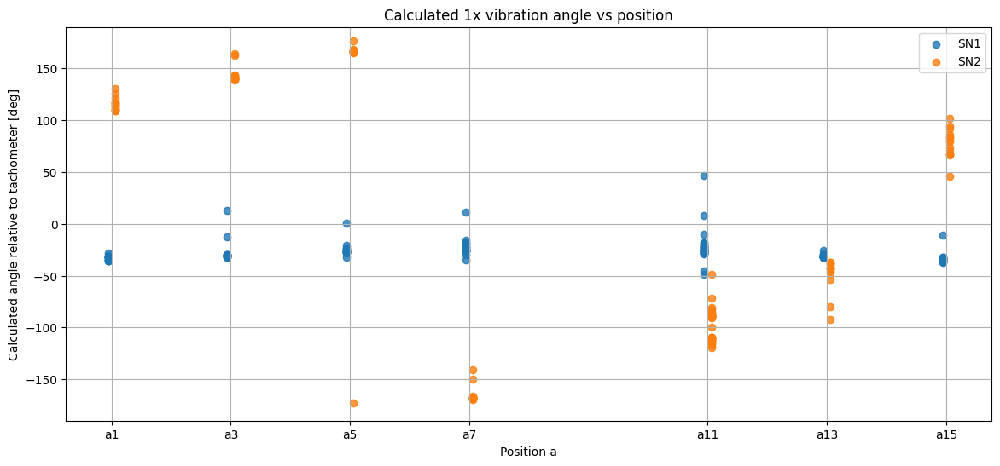

In [7]:
plt.figure(figsize=(14, 6))

sensor_offsets = {
    "SN1": -0.06,
    "SN2": 0.06,
}

for sensor, sensor_df in plot_df.groupby("sensor"):
    x_plot = sensor_df["position_number"] + sensor_offsets.get(sensor, 0.0)

    plt.scatter(x_plot, sensor_df["angle_deg"], label=sensor, alpha=0.8)

    if show_scatter_labels:
        for x_val, (_, row) in zip(x_plot, sensor_df.iterrows()):
            plt.annotate(
                f"{row['position_label']} {row['sensor']}",
                (x_val, row["angle_deg"]),
                textcoords="offset points",
                xytext=(4, 4),
                fontsize=8
            )

plt.xlabel("Position a")
plt.ylabel("Calculated angle relative to tachometer [deg]")
plt.title("Calculated 1x vibration angle vs position")
plt.grid(True)
plt.legend()

x_ticks = sorted(plot_df["position_number"].unique())
x_labels = [
    plot_df.loc[plot_df["position_number"] == x, "position_label"].iloc[0]
    for x in x_ticks
]

plt.xticks(x_ticks, x_labels)
plt.ylim(-190, 190)
plt.show()

## 5. Vector

,filename,sensor,position_label,rotation_frequency_Hz,value_g,angle_deg,x,y
0,v01_14_a1_zew_processed.csv,SN1,a1,28.946996,0.031754,-28.384284,0.027937,-0.015096
1,v02_14_a1_zew_processed.csv,SN1,a1,33.165992,0.026752,-30.880720,0.022960,-0.013731
2,v03_14_a1_zew_processed.csv,SN1,a1,52.178344,0.091828,-32.233799,0.077675,-0.048979
3,v04_14_a1_zew_processed.csv,SN1,a1,67.285421,0.123936,-35.605171,0.100766,-0.072155
4,v05_14_a1_zew_processed.csv,SN1,a1,67.562887,0.053421,-35.686874,0.043389,-0.031163
...,...,...,...,...,...,...,...,...
219,v10_14_a15_zew_processed.csv,SN2,a15,99.598784,0.096406,74.037493,0.026512,0.092688
220,v11_14_a15_zew_processed.csv,SN2,a15,106.736156,0.083557,70.696660,0.027621,0.078860
221,v12_14_a15_zew_processed.csv,SN2,a15,112.993103,0.133104,67.452247,0.051039,0.122930
222,v13_14_a15_zew_processed.csv,SN2,a15,114.975439,0.122862,66.512419,0.048967,0.112682


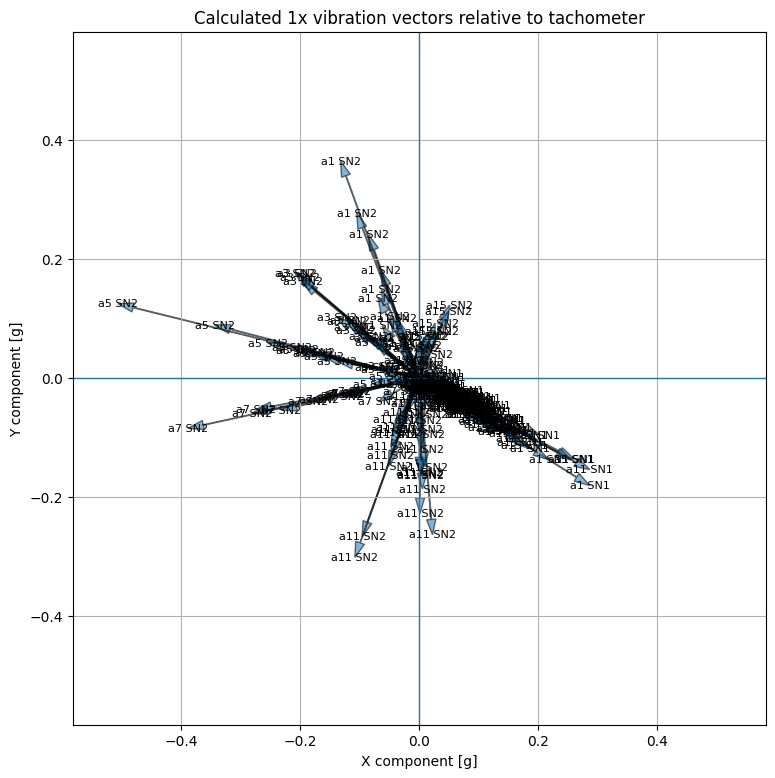

In [8]:
vector_df = plot_df.copy()

theta = np.deg2rad(vector_df["angle_deg"])
vector_df["x"] = vector_df["value_g"] * np.cos(theta)
vector_df["y"] = vector_df["value_g"] * np.sin(theta)

display(vector_df[[
    "filename",
    "sensor",
    "position_label",
    "rotation_frequency_Hz",
    "value_g",
    "angle_deg",
    "x",
    "y",
]])

plt.figure(figsize=(9, 9))
ax = plt.gca()

max_value = vector_df["value_g"].max()

if not np.isfinite(max_value) or max_value <= 0:
    max_value = 1.0

for _, row in vector_df.iterrows():
    ax.arrow(
        0,
        0,
        row["x"],
        row["y"],
        length_includes_head=True,
        head_width=0.03 * max_value,
        head_length=0.05 * max_value,
        alpha=0.55
    )

    ax.text(
        row["x"],
        row["y"],
        f"{row['position_label']} {row['sensor']}",
        fontsize=8,
        ha="center",
        va="center"
    )

max_abs = max(vector_df["x"].abs().max(), vector_df["y"].abs().max())

if not np.isfinite(max_abs) or max_abs <= 0:
    max_abs = 1.0

margin = 0.15 * max_abs

ax.set_xlim(-max_abs - margin, max_abs + margin)
ax.set_ylim(-max_abs - margin, max_abs + margin)

ax.axhline(0, linewidth=1)
ax.axvline(0, linewidth=1)

ax.set_aspect("equal", adjustable="box")
ax.set_xlabel("X component [g]")
ax.set_ylabel("Y component [g]")
ax.set_title("Calculated 1x vibration vectors relative to tachometer")
ax.grid(True)

plt.show()

## 6. Averaged vector 

,position_label,position_number,sensor,n_files,value_g,angle_deg,x,y
0,a1,1,SN1,14,0.123860,-33.187133,0.103657,-0.067798
1,a1,1,SN2,14,0.145753,112.992737,-0.056933,0.134174
2,a3,3,SN1,14,0.101263,-29.810811,0.087863,-0.050342
3,a3,3,SN2,14,0.157533,141.549689,-0.123372,0.097960
4,a5,5,SN1,14,0.110801,-25.987197,0.099598,-0.048550
5,a5,5,SN2,14,0.193835,167.264272,-0.189066,0.042732
6,a7,7,SN1,14,0.094657,-22.639596,0.087363,-0.036437
7,a7,7,SN2,14,0.168575,-167.100457,-0.164321,-0.037633
8,a11,11,SN1,28,0.094922,-25.161944,0.085915,-0.040359
9,a11,11,SN2,28,0.121934,-97.911000,-0.016782,-0.120774


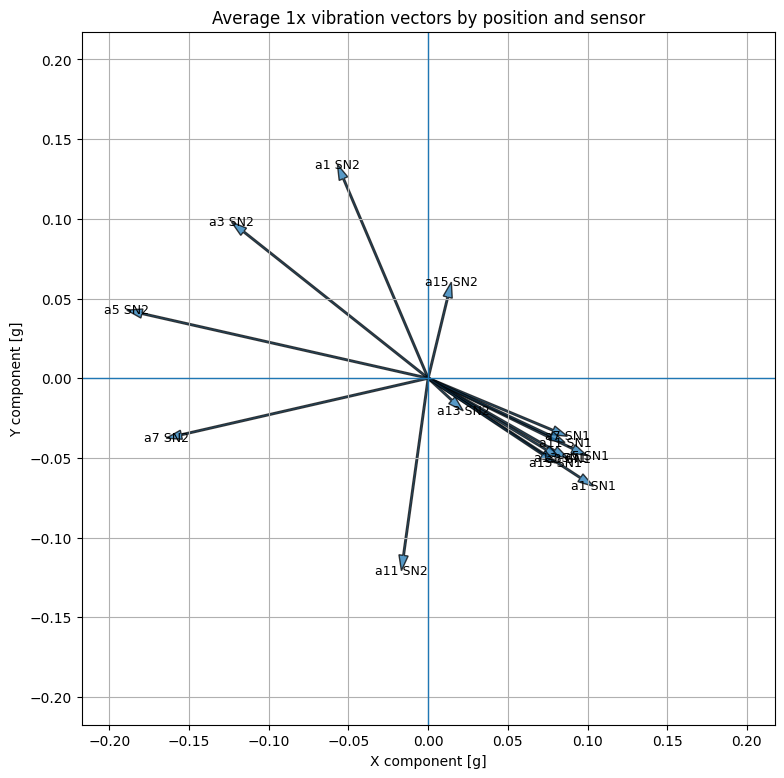

In [9]:
avg_rows = []

for (position_label, position_number, sensor), group in vector_df.groupby(
    ["position_label", "position_number", "sensor"]
):
    x_mean = group["x"].mean()
    y_mean = group["y"].mean()

    value_mean = np.sqrt(x_mean**2 + y_mean**2)
    angle_mean = wrap_phase_deg(np.rad2deg(np.arctan2(y_mean, x_mean)))

    avg_rows.append({
        "position_label": position_label,
        "position_number": position_number,
        "sensor": sensor,
        "n_files": len(group),
        "value_g": value_mean,
        "angle_deg": angle_mean,
        "x": x_mean,
        "y": y_mean,
    })

avg_vector_df = pd.DataFrame(avg_rows)
avg_vector_df = avg_vector_df.sort_values(["position_number", "sensor"]).reset_index(drop=True)

display(avg_vector_df)

avg_vector_df.to_csv("imbalance_vectors_tacho_fft_phase_averaged_by_position_sensor.csv", index=False)

plt.figure(figsize=(9, 9))
ax = plt.gca()

max_value = avg_vector_df["value_g"].max()

if not np.isfinite(max_value) or max_value <= 0:
    max_value = 1.0

for _, row in avg_vector_df.iterrows():
    ax.arrow(
        0,
        0,
        row["x"],
        row["y"],
        length_includes_head=True,
        head_width=0.03 * max_value,
        head_length=0.05 * max_value,
        alpha=0.75
    )

    ax.text(
        row["x"],
        row["y"],
        f"{row['position_label']} {row['sensor']}",
        fontsize=9,
        ha="center",
        va="center"
    )

max_abs = max(avg_vector_df["x"].abs().max(), avg_vector_df["y"].abs().max())

if not np.isfinite(max_abs) or max_abs <= 0:
    max_abs = 1.0

margin = 0.15 * max_abs

ax.set_xlim(-max_abs - margin, max_abs + margin)
ax.set_ylim(-max_abs - margin, max_abs + margin)

ax.axhline(0, linewidth=1)
ax.axvline(0, linewidth=1)

ax.set_aspect("equal", adjustable="box")
ax.set_xlabel("X component [g]")
ax.set_ylabel("Y component [g]")
ax.set_title("Average 1x vibration vectors by position and sensor")
ax.grid(True)

plt.show()